<a href="https://colab.research.google.com/github/badreldin2/UnpackAICourse/blob/main/Badr_bearClassifier_lesson2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 5.0MB/s 
     |████████████████████████████████| 194kB 7.9MB/s 
     |████████████████████████████████| 51kB 5.0MB/s 
     |████████████████████████████████| 1.2MB 10.3MB/s 
     |████████████████████████████████| 61kB 6.9MB/s 
     |████████████████████████████████| 776.8MB 24kB/s 
     |████████████████████████████████| 12.8MB 245kB/s 
     |████████████████████████████████| 51kB 5.8MB/s 
ERROR: torchtext 0.9.0 has requirement torch==1.8.0, but you'll have torch 1.7.1 which is incompatible.
Mounted at /content/gdrive


In [2]:
from fastbook import *
from fastai.vision.widgets import *

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', '3d4de4d672254acd9d4fd0e4408f40bd')

# New Section

In [4]:
search_images_bing

<function fastbook.search_images_bing>

# New Section

In [5]:
results = search_images_bing(key, 'grizzly bear')
# ims = results.attrgot('content_url')  # azure API has changed
ims = results.attrgot('contentUrl')
len(ims)

150

In [6]:
ims

(#150) ['http://2.bp.blogspot.com/-NjMTuklENdE/UHzVv_8dIxI/AAAAAAAAA-U/tNBsQDn8kFI/s1600/Grizzly+Bear+Pic.jpg','http://www.oregonzoo.org/sites/default/files/gallery/images/H_orig_grizzlies_grizzly_gal.jpg','https://i0.wp.com/rangerrick.org/wp-content/uploads/2018/04/RRMAR13_6-11Grizzlies.jpg?fit=1156%2C650&ssl=1','http://www.cs.columbia.edu/~sedwards/photos/kyle200604/20060412-7108%20Grizzly%20bear.jpg','https://news.nationalgeographic.com/content/dam/news/2016/03/04/grizzly_delisting/01grizzlydelisting.ngsversion.1457364600397.adapt.1900.1.jpg','https://wallpapertag.com/wallpaper/full/c/c/6/437135-grizzly-bear-backgrounds-1920x1080-for-tablet.jpg','http://www.pbs.org/wnet/nature/files/2018/07/Bear133.jpg','https://www.mtpr.org/sites/kufm/files/styles/x_large/public/201809/grizzly-bear-02_Istock.jpg','http://www.telegraph.co.uk/content/dam/news/2016/06/21/99682788_Two_grizzly_bears_at_the_Woodland_Park_Zoo_eat_salmon_after_the_fish_was_tossed_to_them_by-xlarge_trans_NvBQzQNjv4BqDfnT11g

In [7]:
dest = 'bear.jpg'
download_url(ims[1], dest, overwrite=True)

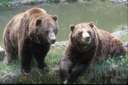

In [8]:
im = Image.open(dest)
im.to_thumb(128,128)

In [9]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [10]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} bear')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [11]:
fns = get_image_files(path)
fns

(#427) [Path('bears/grizzly/00000127.jpg'),Path('bears/grizzly/00000079.jpg'),Path('bears/grizzly/00000120.jpg'),Path('bears/grizzly/00000064.jpg'),Path('bears/grizzly/00000072.jpg'),Path('bears/grizzly/00000063.jpg'),Path('bears/grizzly/00000005.jpg'),Path('bears/grizzly/00000089.jpg'),Path('bears/grizzly/00000020.jpg'),Path('bears/grizzly/00000139.jpg')...]

In [12]:
failed = verify_images(fns)
failed

(#10) [Path('bears/grizzly/00000144.jpg'),Path('bears/grizzly/00000017.jpg'),Path('bears/grizzly/00000048.jpg'),Path('bears/grizzly/00000097.jpg'),Path('bears/black/00000063.jpg'),Path('bears/black/00000057.jpg'),Path('bears/black/00000100.jpg'),Path('bears/black/00000132.jpg'),Path('bears/teddy/00000123.jpg'),Path('bears/teddy/00000093.jpg')]

In [13]:
failed.map(Path.unlink);

In [15]:
class DataLoaders(GetAttr):
    def __init__(self, *loaders): self.loaders = loaders
    def __getitem__(self, i): return self.loaders[i]
    train,valid = add_props(lambda i,self: self[i])

In [19]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [20]:
dls = bears.dataloaders(path)

In [21]:
print(path)

bears


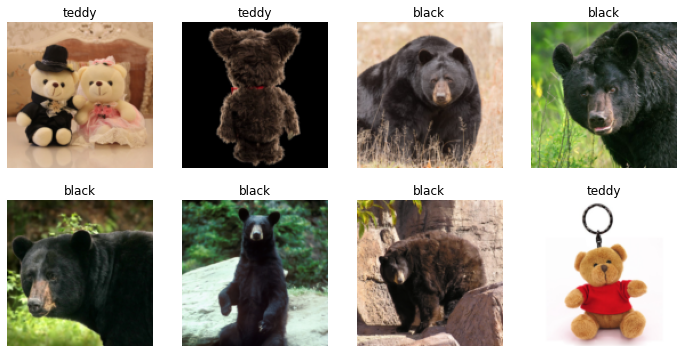

In [23]:
dls.valid.show_batch(max_n=8, nrows=2)

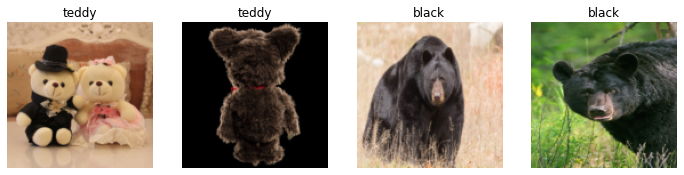

In [24]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

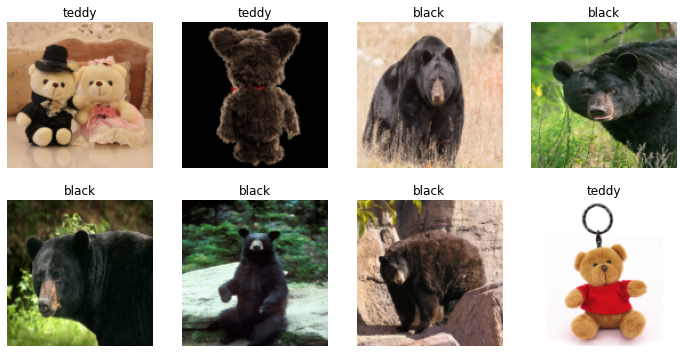

In [25]:
dls.valid.show_batch(max_n=8, nrows=2)

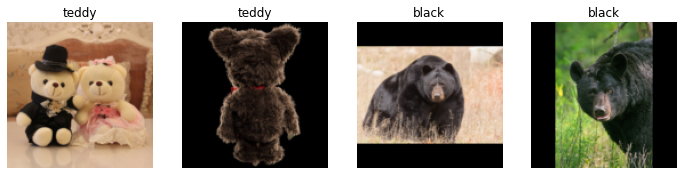

In [26]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

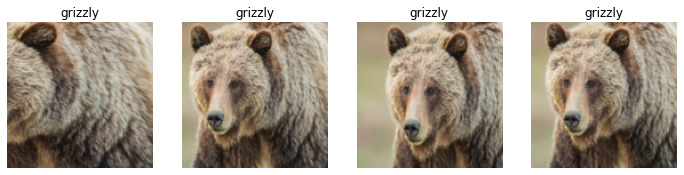

In [27]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

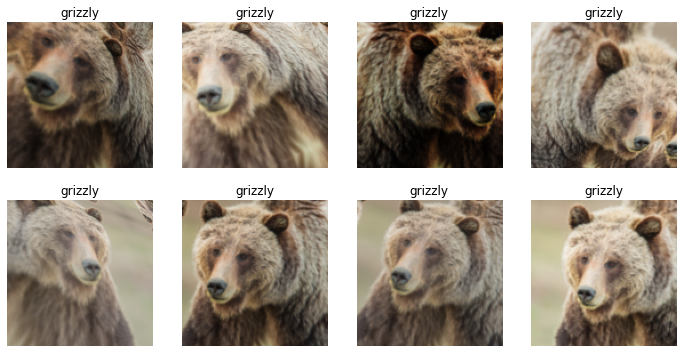

In [28]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [29]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [30]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.359603,0.503813,0.180723,00:17


epoch,train_loss,valid_loss,error_rate,time
0,0.181534,0.485839,0.132530,00:17
1,0.122043,0.518556,0.168675,00:17
2,0.098724,0.531032,0.204819,00:17
3,0.079088,0.524915,0.204819,00:17


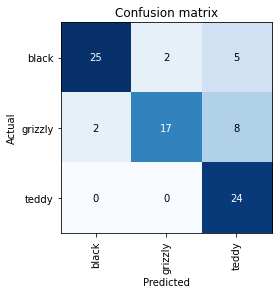

In [31]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

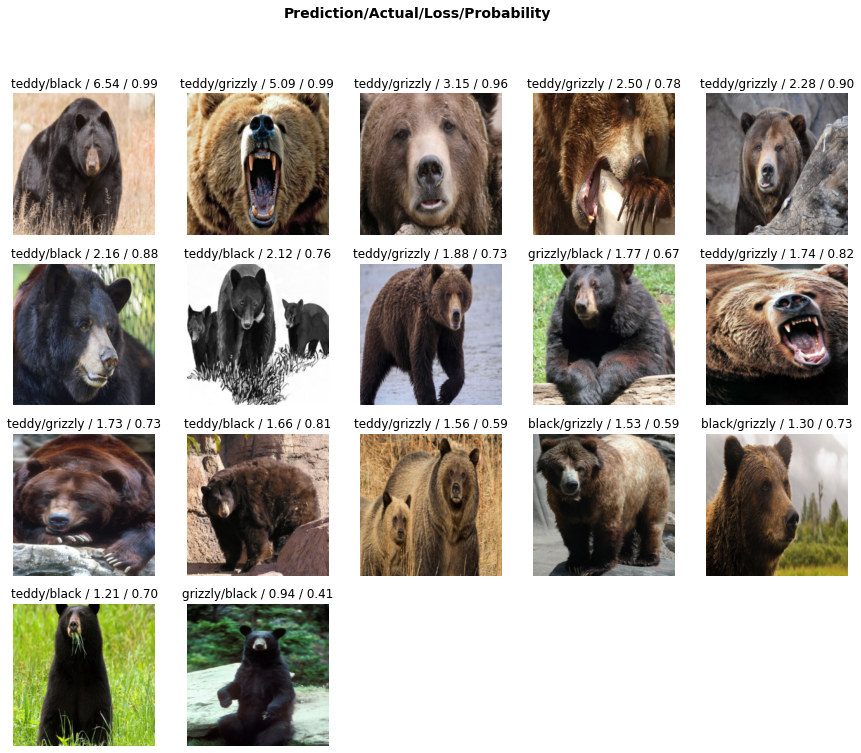

In [33]:
interp.plot_top_losses(17, nrows=4)

In [34]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [35]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [36]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.583022,0.244775,0.120482,00:18


epoch,train_loss,valid_loss,error_rate,time
0,0.169057,0.268412,0.096386,00:17
1,0.129240,0.182787,0.096386,00:18
2,0.105146,0.173689,0.072289,00:18
3,0.100018,0.173566,0.072289,00:17


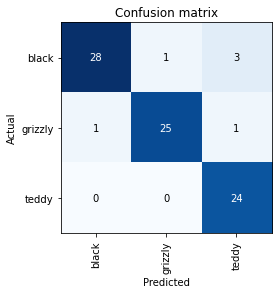

In [37]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

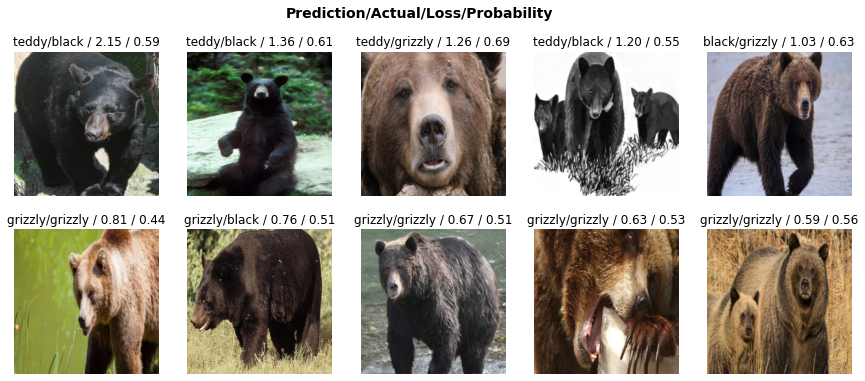

In [38]:
interp.plot_top_losses(10, nrows=2)

In [39]:
learn.export()

In [40]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [41]:
learn_inf = load_learner(path/'export.pkl')

In [42]:
!wget https://raw.githubusercontent.com/vtecftwy/fastbook/master/images/grizzly.jpg

--2021-03-13 11:15:19--  https://raw.githubusercontent.com/vtecftwy/fastbook/master/images/grizzly.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 697626 (681K) [image/jpeg]
Saving to: ‘grizzly.jpg’

grizzly.jpg         100%[===================>] 681.28K  --.-KB/s    in 0.06s   

2021-03-13 11:15:19 (10.9 MB/s) - ‘grizzly.jpg’ saved [697626/697626]



In [43]:
learn_inf.predict('grizzly.jpg')

('grizzly', tensor(1), tensor([0.0275, 0.9491, 0.0234]))

In [44]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [45]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [48]:
btn_upload = SimpleNamespace(data = ['sample_data/grizzly.jpg'])